## River Elevation Model

#### Takes the height of the river or actual water level of the river, and shows all of the heights above that water level
#### It provides the movements of the river and also the slight changes in elevation that take place from riverbank

### Data 

#### Raster data
#### Digital elevation model from the U.S Geological Survey


### HyRiver: Python package for Hydroclimate data

###  Rasterio: It reads, opens and visualization of the raster data
#### Raster data: Raster data is any pixelated (or gridded) data where each pixel is associated with a specific geographical location.

### Xarray: It is used in python for working with multi-dimensional data

### Rioxarray: Rio plus xarray
#### It can also read raster data and do other things like clipping and so on

In [1]:
!pip install osmnx scipi xarray rioxarray matplotlib datashader -q

ERROR: Could not find a version that satisfies the requirement scipi (from versions: none)
ERROR: No matching distribution found for scipi


In [2]:
!pip install xarray-spatial --user -q

In [3]:
!pip install geopandas --user

  Using cached cligj-0.7.2-py3-none-any.whl (7.1 kB)
  Using cached click_plugins-1.1.1-py2.py3-none-any.whl (7.5 kB)


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [6]:
!python -m pip install osmnx

  Using cached osmnx-1.8.1-py3-none-any.whl (102 kB)


In [8]:
!pip install rioxarray

In [11]:
! pip install geojson

### Imports

In [70]:
from pathlib import Path
from IPython.core.display import Video

import numpy as np
import pandas as pd
import geopandas as gpd  # Vector data handling
import osmnx as ox       # Downloading data from OSM

from shapely.geometry import box
from scipy.spatial import cKDTree as KDTree # For Inverse Distance Weight calculation

import xarray as xr    
import xrspatial    # Hillshading
import rioxarray    # Working with geospatial data in xarray

import matplotlib.pyplot as plt
from datashader.transfer_functions import shade, stack

### Download & Load DEM

- [USGS LidarExplorer](https://prd-tnm.s3.amazonaws.com/LidarExplorer/index.html#/)

In [169]:
dem = rioxarray.open_rasterio('USGS_13_n38w090_20230117.tif')

In [170]:
import geojson

In [171]:
geom = '''{"type": "Polygon",
                "coordinates":[[
                [-89.5464277378,37.0327029788],
                [-89.222117982,37.0327029788],
                [-89.222117982,37.4366526437],
                [-89.5464277378,37.4366526437],
                [-89.5464277378,37.0327029788]]]}'''

In [172]:
# geometry into an array, for instance: for the string geometry, we load that as a proper geojson which represents the cropping_geometries
cropping_geometries = [geojson.loads(geom)]
cropped = dem.rio.clip(geometries=cropping_geometries, crs=4326)



In [173]:
cropped = cropped.coarsen(x=3, boundary='trim').mean().coarsen(y=3, boundary='trim').mean()

### Plotting the DEM

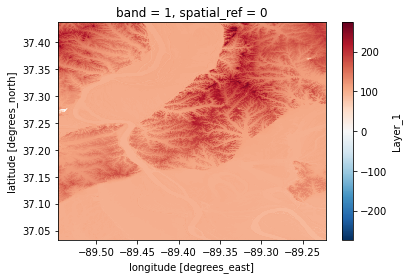

In [174]:
# Plot the cropped DEM with the default colormap
cropped.squeeze().plot.imshow()

In [175]:
cropped

<xarray.DataArray (band: 1, y: 1454, x: 1167)>
array([[[134.48756 , 135.5825  , 139.94696 , ..., 180.4508  ,
         181.71014 , 182.59216 ],
        [136.7715  , 138.23802 , 138.35747 , ..., 181.1554  ,
         182.92229 , 184.28496 ],
        [137.46547 , 143.09229 , 142.24017 , ..., 182.1092  ,
         183.71037 , 185.07027 ],
        ...,
        [ 99.60156 ,  99.272736,  98.85468 , ...,  89.47881 ,
          91.0444  ,  94.46994 ],
        [ 99.473335,  99.05008 ,  98.77167 , ...,  89.4252  ,
          89.52277 ,  90.38688 ],
        [ 99.34281 ,  98.85027 ,  98.93319 , ...,  89.422905,
          89.42037 ,  89.427574]]], dtype=float32)
Coordinates:
  * y            (y) float64 37.44 37.44 37.44 37.44 ... 37.03 37.03 37.03 37.03
  * x            (x) float64 -89.55 -89.55 -89.55 ... -89.22 -89.22 -89.22
  * band         (band) int32 1
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:          Area
    BandDefinitionKeyword:  *
    DataType:               *
    DESCRIPTION:            *
    LAYER_TYPE:             athematic
    RepresentationType:     *
    scale_factor:           1.0
    add_offset:             0.0
    long_name:              Layer_1
    _FillValue:             -999999.0

### Fetch coordinates of the river

In [176]:
river = ox.geocode_to_gdf('Mississippi River', which_result=6)
river = river.to_crs(cropped.rio.crs)

<Axes: >

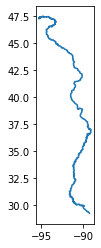

In [177]:
river.plot()

###  Cut to area of interest

In [178]:
river

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTILINESTRING ((-94.08600 46.45034, -94.0870...",47.49749,29.157839,-89.098843,-95.246941,328546741,relation,1756854,39.548248,-91.153628,waterway,river,18,0.577295,river,Mississippi River,"Mississippi River, United States"


In [179]:
cropped.rio.bounds()

(-89.54629629634545, 37.03287036966892, -89.22231481451543, 37.436574073806895)

In [180]:
bounds = cropped.rio.bounds()
xmin, ymin, xmax, ymax = bounds

In [181]:
river = river.clip(bounds)

In [182]:
river

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,class,type,place_rank,importance,addresstype,name,display_name
0,"MULTILINESTRING ((-89.43961 37.43657, -89.4377...",47.49749,29.157839,-89.098843,-95.246941,328546741,relation,1756854,39.548248,-91.153628,waterway,river,18,0.577295,river,Mississippi River,"Mississippi River, United States"


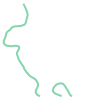

In [183]:
river_geom = river.geometry.iloc[0]
river_geom

### DEM

In [184]:
cropped = cropped.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

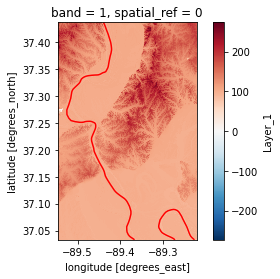

In [186]:
fig, ax = plt.subplots()
cropped.squeeze().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

### Calculate REM

In [187]:
import shapely

def split_coords(geom):
    x = []
    y = []
    for i in shapely.get_coordinates(geom):
        x.append(i[0])
        y.append(i[1])
    return x, y
        

In [188]:
xs, ys = split_coords(river_geom)
xs, ys = xr.DataArray(xs, dims='z'), xr.DataArray(ys, dims='z')

In [189]:
sampled = cropped.interp(x=xs, y=ys, method='nearest').dropna(dim='z')

D:\Anaconda\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
D:\Anaconda\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imax = index.get_loc(maxval, method="nearest")
D:\Anaconda\lib\site-packages\xarray\core\missing.py:562: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  imin = index.get_loc(minval, method="nearest")
D:\Anaconda\lib\site-packages\xarray\core\missing.py:563: FutureWarning: Passing method to Float64Index.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
 

### Interpolate

In [190]:
# Sampled river coordinates
c_sampled = np.vstack([sampled.coords[c].values for c in ('x', 'y')]).T

# All (x, y) coordinates of the original DEM
c_x, c_y = [cropped.coords[c].values for c in ('x', 'y')]
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Sampled values
values = sampled.values.ravel()

In [191]:
c_interpolate

array([[-89.54625   ,  37.43652778],
       [-89.54597222,  37.43652778],
       [-89.54569444,  37.43652778],
       ...,
       [-89.22291667,  37.03291667],
       [-89.22263889,  37.03291667],
       [-89.22236111,  37.03291667]])

In [193]:
tree = KDTree(c_sampled)

In [194]:
tree

In [195]:
# IWD interpolation
distances, indices = tree.query(c_interpolate, k=50)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

In [196]:
interpolated_values

array([98.31997252, 98.32033693, 98.32070347, ..., 90.30985072,
       90.3143536 , 90.3187768 ])

In [197]:
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=('x', 'y'), coords={'x': c_x, 'y': c_y}
)

<Axes: xlabel='x', ylabel='y'>

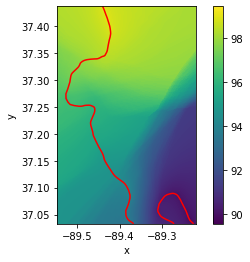

In [198]:
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

In [199]:
rem = cropped - elevation_raster

### Visualize

In [200]:
colors = ['#f2f7fb', '#81a8cb', '#37123d']

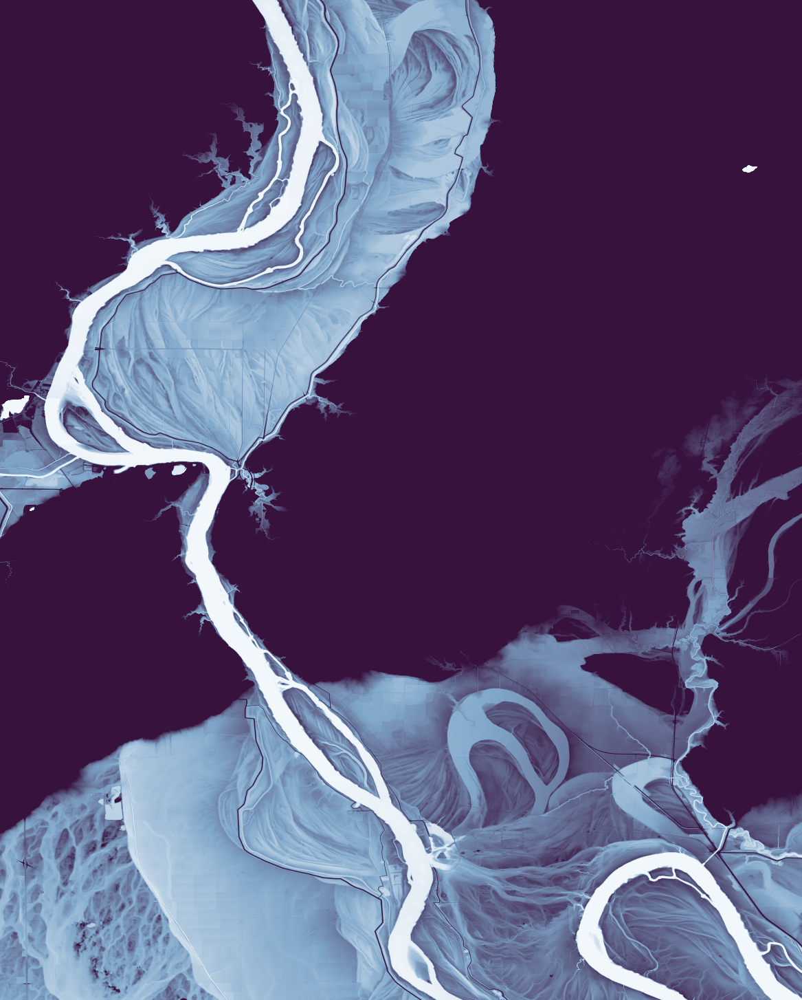

In [205]:
shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear')

### visualize the DEM along with the REM

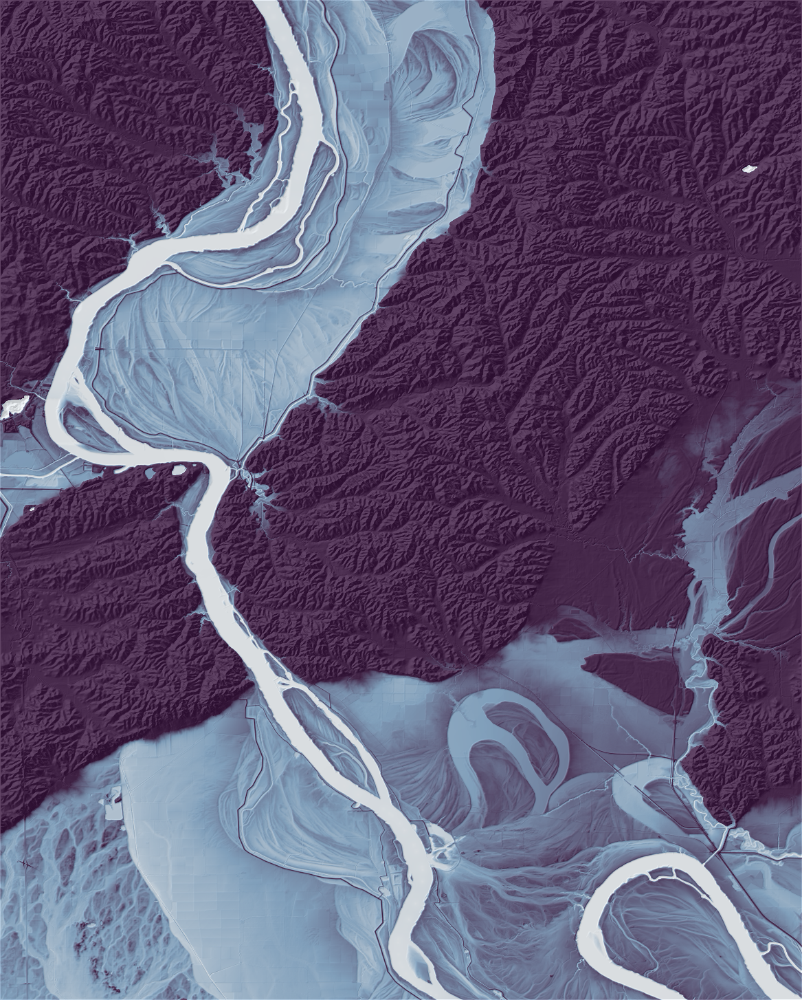

In [206]:
a = shade(xrspatial.hillshade(cropped.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')
b = shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)
stack(a, b)